In [2]:
try:
    import numpy as np
except ImportError:
    !python -m pip install numpy
try:
    import gym
    from gym import spaces
except ImportError:
    !python -m pip install gym
try:
    from stable_baselines3 import PPO
except ImportError:
    !python -m pip install stable-baselines3
try:
    import tensorflow
except ImportError:
    !python -m pip install tensorflow
    #or python -m pip install --upgrade https://storage.googleapis.com/tensorflow/mac/cpu/tensorflow-1.12.0-py3-none-any.whl
try:
    import shimmy
except ImportError:
    !python -m pip install shimmy
try:
    import gymnasium
except ImportError:
    !python -m pip install gymnasium
try:
    import sklearn
except ImportError:
    !python -m pip install scikit-learn
try:
    import pandas as pd
except ImportError:
    !python -m pip install pandas
try:
    import mplfinance
except ImportError:
    !python -m pip install mplfinance



In [3]:
from sklearn.preprocessing import MinMaxScaler
from stable_baselines3 import PPO
from gym import spaces
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
import mplfinance
import gymnasium
import gym
import shimmy

# Importing and Pre-processing Data

In [4]:
file_path = '..\\Data\\df.csv'
df = pd.read_csv(file_path)
# df = df.drop(df.columns[0], axis=1)
print(df.head(5))

       open_time  open_price  high_price  low_price  close_price  volume  \
0  1591548900000      9484.0      9490.0     9477.0       9488.0   4.685   
1  1591549200000      9488.0      9488.0     9471.0       9471.0   6.685   
2  1591549500000      9471.0      9477.5     9471.0       9475.5   2.015   
3  1591549800000      9475.5      9475.5     9471.0       9475.0   1.381   
4  1591550100000      9475.0      9480.5     9474.0       9478.0   3.898   

     turnover  
0  44451.2800  
1  63313.6350  
2  19093.1325  
3  13084.9750  
4  36945.2440  


In [5]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# scaler = MinMaxScaler()

# df_test = df.copy()
# df_test[['open_price', 'high_price', 'low_price', 'close_price', 'volume', 'turnover']] = scaler.fit_transform(df_test[['open_price', 'high_price', 'low_price', 'close_price', 'volume','turnover']])

scaler = MinMaxScaler()

# Copy the DataFrame
df_test = df.copy()

# Extract the columns to normalize together and separately
important_columns = ['open_price', 'high_price', 'low_price', 'close_price']
irrelevant_columns = ['volume', 'turnover']

# Normalize important columns together
df_test[important_columns] = scaler.fit_transform(df_test[important_columns])

# Normalize irrelevant columns separately
scaler_irrelevant = MinMaxScaler()
df_test[irrelevant_columns] = scaler_irrelevant.fit_transform(df_test[irrelevant_columns])

# Drop NaN values, if any
df_test = df_test.dropna()

# Print the resulting DataFrame
print(df_test)


            open_time  open_price  high_price  low_price  close_price  \
0       1591548900000    0.008750    0.008613   0.009828     0.008811   
1       1591549200000    0.008811    0.008582   0.009736     0.008549   
2       1591549500000    0.008549    0.008421   0.009736     0.008619   
3       1591549800000    0.008619    0.008390   0.009736     0.008611   
4       1591550100000    0.008611    0.008467   0.009782     0.008657   
...               ...         ...         ...        ...          ...   
399995  1712065800000    0.868672    0.867543   0.865183     0.869825   
399996  1712066100000    0.869825    0.867160   0.868889     0.869201   
399997  1712066400000    0.869201    0.869284   0.869243     0.871399   
399998  1712066700000    0.871399    0.869720   0.870786     0.872567   
399999  1712067000000    0.872567    0.870892   0.872816     0.871885   

          volume  turnover  
0       0.000073  0.000028  
1       0.000105  0.000040  
2       0.000032  0.000012  
3      

In [6]:
split = int(0.8 * len(df))

# Training data
train_df = df[:split]
train_df_test = df_test[:split]

# Testing Data
test_df = df[split:]
test_df_test = df_test[split:]

print(train_df_test)



            open_time  open_price  high_price  low_price  close_price  \
0       1591548900000    0.008750    0.008613   0.009828     0.008811   
1       1591549200000    0.008811    0.008582   0.009736     0.008549   
2       1591549500000    0.008549    0.008421   0.009736     0.008619   
3       1591549800000    0.008619    0.008390   0.009736     0.008611   
4       1591550100000    0.008611    0.008467   0.009782     0.008657   
...               ...         ...         ...        ...          ...   
319995  1687979400000    0.328059    0.327489   0.329189     0.328705   
319996  1687979700000    0.328705    0.327750   0.329836     0.328915   
319997  1687980000000    0.328915    0.327617   0.329424     0.328401   
319998  1687980300000    0.328401    0.327166   0.326557     0.325621   
319999  1687980600000    0.325621    0.324720   0.323653     0.325347   

          volume  turnover  
0       0.000073  0.000028  
1       0.000105  0.000040  
2       0.000032  0.000012  
3      

# Preparing the Model

## Trading Environment

In [7]:
class TradingEnvironment(gym.Env):
    """A trading environment"""
    metadata = {'render.modes': ['human']}

    def __init__(self, df):
        super(TradingEnvironment, self).__init__()
        
        #Environment Variables
        self.df = df  # DataFrame containing market data
        self.action_space = spaces.Discrete(3) #(buy, sell, hold)

        #Active Trade Variables
        self.position = None  # 'long', 'short', or None
        self.tp = None  # Take Profit level
        self.sl = None  # Stop Loss level
        self.accountBalance = 100
        self.leverageToUse = 10
        self.entry_price = 0
        self.trade_fee = 0
        self.fee_rate = 0.00055*2
        self.tradeValue = 0
        self.tradeQuantity = 0

        self.long_gaps = []
        self.short_gaps = []
        self.long_Gaps_Checked_Until = 0
        self.short_Gaps_Checked_Until = 0
        self.predicted_zeros = 0
        self.predicted_longs = 0
        self.predicted_shorts = 0

        #Evaluation Variables
        self.overTimeWinnings = []
        self.lossesToWinsLog = []
        self.executedTrades = []
        self.currentTrade = {}
        self.episode_reward = 0
        self.total_trades = 0
        self.total_wins = 0
        self.total_losses = 0
        self.lossesToWins = 0

        self.current_step = 100
        # Define observation space (using the shape of the market data)
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(len(df.columns),), dtype=np.float32)


    def reset(self):
        if self.currentTrade != {}:
            self.executedTrades.append(self.currentTrade)
            self.currentTrade = {}
        #Reset Trade Related Variables
        self.trade_fee = 0
        self.tradeQuantity = 0
        self.entry_price = 0
        self.tp = None
        self.sl = None

        # Reset state and position tracking variables
        self.position = None
        self.episode_reward = 0
        # self.current_step = 100



        #Progress Tracking Variables
        self.overTimeWinnings.append(self.accountBalance)
        self.lossesToWinsLog.append(self.lossesToWins)
        return self.df.iloc[self.current_step].values.astype(np.float32)

    def calculate_reward(self, entry_price, current_price, position):
        if position == 'Long':
            tradeResult = (current_price - entry_price)*self.tradeQuantity - self.trade_fee
            print("Trade Fee is:",self.trade_fee)
            self.accountBalance += tradeResult

            print('Trade Type: ', position, ' resulted in: ', tradeResult, ' Making the account balance: ', self.accountBalance)
            return tradeResult  # Profit or loss for long position
        elif position == 'Short':
            tradeResult = (entry_price - current_price)*self.tradeQuantity - self.trade_fee
            print("Trade Fee is:",self.trade_fee)
            self.accountBalance += tradeResult

            print('Trade Type: ', position, ' resulted in: ', tradeResult, ' Making the account balance: ', self.accountBalance)
            return tradeResult  # Profit or loss for short position

    def step(self, action):
        # Get the current price from the dataframe (you might use 'close_price')
        current_price_high = self.df.iloc[self.current_step]['high_price']
        current_price_low = self.df.iloc[self.current_step]['low_price']
        candle_open_time = pd.to_datetime(self.df.iloc[self.current_step]['open_time'], unit='ms')
        print(candle_open_time)

        reward = 0
        done = False
        info = {}
        self.add_new_gaps()

        if action == 0:
            self.predicted_zeros +=1
        elif action == 1:
            self.predicted_longs +=1
        elif action == 2:
            self.predicted_shorts +=1

        # If there's no open position, check if the agent wants to open one
        is_gap, gap = self.if_current_candle_in_gap()
        if self.position is None:
            if action == 1 and is_gap == 1:  # Buy
                self.total_trades +=1
                self.position = 'Long'
                ##Old
                # self.entry_price = avg_price
                # self.tradeValue = self.leverageToUse * self.accountBalance
                # self.tradeQuantity = self.tradeValue / self.entry_price
                # self.trade_fee = self.tradeValue * self.fee_rate

                # # Define your TP and SL based on your strategy
                # self.tp = self.entry_price * 1.012
                # self.sl = self.entry_price * 0.994

                #New
                self.entry_price = gap['entry_price']
                self.sl = gap['stop_loss']
                stop_loss_in_perc = gap['stop_loss_in_perc']
                money_risk = self.accountBalance * 0.02
                self.tradeValue = money_risk / stop_loss_in_perc

                tp_in_perc = stop_loss_in_perc * 2
                self.tp = self.entry_price * (1 + tp_in_perc)

                self.tradeQuantity = self.tradeValue / self.entry_price
                self.trade_fee = self.tradeValue * self.fee_rate
                if(self.trade_fee > 5):
                    print("here")
                print("Trade Fee is:", self.trade_fee)
                # Define your TP and SL based on your strategy

                self.currentTrade = { "Position Type" : self.position,
                                     "Entry Price" : self.entry_price,
                                     "Trade total Value" : self.tradeValue,
                                     "Quantity" : self.tradeQuantity,
                                     "Take Profit " : self.tp,
                                     "Stop Loss " : self.sl,
                                     "Entry Time" : candle_open_time
                                     }
                
                print("Entering a Long Trade at - ", self.entry_price)

            elif action == 2 and is_gap == 2:  # Sell/Short
                self.total_trades +=1
                self.position = 'Short'

                ##Old
                # self.entry_price = avg_price
                # self.tradeValue = self.leverageToUse * self.accountBalance
                # self.tradeQuantity = self.tradeValue / self.entry_price
                # self.trade_fee = self.tradeValue * self.fee_rate

                # # Define your TP and SL based on your strategy
                # self.tp = self.entry_price * 0.988
                # self.sl = self.entry_price * 1.006

                self.entry_price = gap['entry_price']
                self.sl = gap['stop_loss']
                stop_loss_in_perc = gap['stop_loss_in_perc']
                money_risk = self.accountBalance * 0.02
                self.tradeValue = money_risk / stop_loss_in_perc
                tp_in_perc = stop_loss_in_perc * 2
                self.tp = self.entry_price * (1 - tp_in_perc)

                self.tradeQuantity = self.tradeValue / self.entry_price
                self.trade_fee = self.tradeValue * self.fee_rate
                if(self.trade_fee > 5):
                    print("here")
                print("Trade Fee is:", self.trade_fee)

                self.currentTrade = { "Position Type" : self.position,
                                     "Entry Price" : self.entry_price,
                                     "Trade total Value" : self.tradeValue,
                                     "Quantity" : self.tradeQuantity,
                                     "Take Profit " : self.tp,
                                     "Stop Loss " : self.sl,
                                     "Entry Time" : candle_open_time
                                     }
                
                print("Entering a Short Trade Trade at - ", self.entry_price)

        # Check if the position should be closed (TP or SL hit)
        if self.position == 'Long':
            if current_price_high >= self.tp or current_price_low <= self.sl:
                random_number = random.random()
                close_price = 0

                if random_number >= 0.5:
                    if current_price_high >= self.tp:
                        close_price = self.tp
                    else:
                        close_price = self.sl
                else:
                    if current_price_low <= self.sl:
                        close_price = self.sl
                    else:
                        close_price = self.tp

                reward = self.calculate_reward(self.entry_price, close_price , self.position)

                if reward < 0:
                    self.total_losses += 1
                    self.lossesToWins -=1
                else:
                    self.total_wins +=1
                    self.lossesToWins +=1

                print('Long Trade Closed')
                done = True
                self.episode_reward += reward
                self.position = None  # Reset position

        elif self.position == 'Short':
            #If Trade should be closed
            if current_price_low <= self.tp or current_price_high >= self.sl:
                random_number = random.random()
                close_price = 0

                #Since the candle low/high might hit both the TP and SP we simply make it 50/50 which one is checked first
                if random_number >= 0.5:
                    if current_price_high >= self.sl:
                        close_price = self.sl
                    else:
                        close_price = self.tp
                else:
                    if current_price_low <= self.tp:
                        close_price = self.tp
                    else:
                        close_price = self.sl

                reward = self.calculate_reward(self.entry_price, close_price , self.position)

                if reward < 0:
                    self.total_losses += 1
                    self.lossesToWins -=1
                else:
                    self.total_wins +=1
                    self.lossesToWins +=1

                
                print('Short Trade Closed')
                done = True
                self.episode_reward += reward
                self.position = None  # Reset position

        
        self.current_step += 1
            
        next_state = self.df.iloc[self.current_step % len(self.df)].values
        if(self.current_step == len(self.df) - 2):
            return next_state.astype(np.float32), reward, True, info
        
        return next_state.astype(np.float32), reward, done, info

    def render(self, mode='human', close=False):
        # For example, print current step
        print(f"Current Step: {self.current_step}")

    def getTrades(self):
        return self.total_trades
    
    def getTotalWins(self):
        return self.total_wins
    
    def getTotalLosses(self):
        return self.total_losses
    
    def getWinnings(self):
        return self.accountBalance
    
    def add_new_gaps(self):
    # def add_new_gaps(self,current_step,df,long_gaps,short_gaps,long_Gaps_Checked_Until,short_Gaps_Checked_Until,):
    
        if self.current_step > self.long_Gaps_Checked_Until:
            new_long_gaps = self.calculate_long_gaps()
            for gap in new_long_gaps:
                self.long_gaps.append(gap)

        for gap in self.long_gaps:
            if self.current_step - gap['end'] > 2304:
                self.long_gaps.remove(gap)
            else:
                break

        if self.current_step > self.short_Gaps_Checked_Until:
            new_short_gaps = self.calculate_short_gaps()
            for gap in new_short_gaps:
                self.short_gaps.append(gap)

        for gap in self.short_gaps:
            if self.current_step - gap['end'] > 2304:
                self.short_gaps.remove(gap)
            else:
                break

    def calculate_long_gaps(self):
        gaps = []
        for self.long_Gaps_Checked_Until in range(self.long_Gaps_Checked_Until, self.current_step - 2):
            first_candle = self.df.iloc[self.long_Gaps_Checked_Until]
            third_candle = self.df.iloc[self.long_Gaps_Checked_Until + 2]

            if first_candle['high_price'] <= third_candle['low_price']:
                entry_price = (third_candle['low_price'] + first_candle['high_price']) / 2
                stop_loss = first_candle['low_price']
                stop_loss_in_perc = 1 - stop_loss/entry_price
                if(stop_loss_in_perc >= 0.002):
                    gap_info = {
                        'start': self.long_Gaps_Checked_Until,
                        'end': self.long_Gaps_Checked_Until + 2,
                        'time': first_candle['open_time'],
                        'high_price': third_candle['low_price'],
                        'low_price': first_candle['high_price'],
                        'entry_price': entry_price,
                        'stop_loss': first_candle['low_price'],
                        'stop_loss_in_perc': stop_loss_in_perc,
                        'filled': False
                        }
                    gaps.append(gap_info)
            else:
                for gap in gaps[::-1]:
                    if first_candle['low_price'] < gap['high_price']:
                        # Remove the gap from the list as it's no longer needed
                        gaps.remove(gap)

        self.long_Gaps_Checked_Until += 1
        return gaps  # Return the list of gaps for further use or analysis

    def calculate_short_gaps(self):
        gaps = []
        for self.short_Gaps_Checked_Until in range(self.short_Gaps_Checked_Until, self.current_step - 2):
            first_candle = self.df.iloc[self.short_Gaps_Checked_Until]
            third_candle = self.df.iloc[self.short_Gaps_Checked_Until + 2]

            if first_candle['low_price'] > third_candle['high_price']:
                entry_price = (first_candle['low_price'] + third_candle['high_price']) / 2
                stop_loss = first_candle['high_price']
                stop_loss_in_perc = 1 - entry_price/stop_loss
                if(stop_loss_in_perc >= 0.002):
                    gap_info = {
                        'start': self.short_Gaps_Checked_Until,
                        'end': self.short_Gaps_Checked_Until + 2,
                        'time': first_candle['open_time'],
                        'high_price': first_candle['low_price'],
                        'low_price': third_candle['high_price'],
                        'entry_price': entry_price,
                        'stop_loss': first_candle['high_price'],
                        'stop_loss_in_perc': stop_loss_in_perc,
                        'filled': False
                        }
                    gaps.append(gap_info)
            else:
                for gap in gaps[::-1]:

                    if first_candle['high_price'] > gap['low_price'] :
                        # Remove the gap from the list as it's no longer needed
                        gaps.remove(gap)
                        
        self.short_Gaps_Checked_Until += 1
        return gaps  # Return the list of gaps for further use or analysis
        

    def if_current_candle_in_gap(self):
        current_candle = df.iloc[self.current_step]

        for gap in self.long_gaps[::-1]:
            if current_candle['low_price'] <= gap['entry_price']:
                self.long_gaps.remove(gap)
                return 1, gap
            
        for gap in self.short_gaps[::-1]:
            if current_candle['high_price'] >= gap['entry_price']:
                self.short_gaps.remove(gap)
                return 2, gap

        return 0, []
         
    def render_all(self, mode='human'):
        # Plot Total Rewards per Episode
        plt.figure(figsize=(30, 10))

        # Plot Total Profit over Episodes
        plt.subplot(1, 3, 2)
        plt.title('Total Profit over Time')
        plt.plot(self.overTimeWinnings)
        plt.xlabel('Episode')
        plt.ylabel('Total Profit')

        # # Plot Number of Trades over Episodes
        plt.subplot(1, 3, 3)
        plt.title('Number of Trades over Time')
        plt.plot(self.lossesToWinsLog)
        plt.xlabel('Episode')
        plt.ylabel('Number of Trades')

        # plt.tight_layout()
        plt.show()


## Initial Training

In [8]:
import math

def closest_power_of_2(number):
    if number <= 0:
        return 0
    
    # Calculate the exponent of the closest power of 2
    exponent = math.floor(math.log2(number))
    
    # Calculate the closest power of 2
    closest_power = 2 ** exponent
    
    return closest_power

In [9]:
import numpy as np
import matplotlib.pyplot as plt

def simulate_trading(model, test_env, num_steps):
    """
    Simulate trading using the trained model on the test environment.
    Args:
    - model: The trained model.
    - test_env: The trading environment for testing.
    - num_steps: The number of steps to simulate.
    """
    state = test_env.reset()
    for _ in range(num_steps):
        action, _ = model.predict(state)
        state, reward, done, info = test_env.step(action)
        if done:
            state = test_env.reset()
    
    test_env.render_all()
    print("Simulation Results #",_)
    print("Account Balance - ", test_env.accountBalance)
    print("Trades - ", test_env.getTrades())
    print("Wins - ", test_env.getTotalWins())
    print("Lossess - ", test_env.getTotalLosses())
    test_model_winrate = (test_env.getTotalWins() / test_env.total_trades) * 100
    print("Winarte - ", test_model_winrate)
    
    return test_env

In [10]:
print(len(train_df))
print(len(test_df))

320000
80000


### First Model Trained and Results

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


c:\Users\User\OneDrive - Robert Gordon University\Documents\GitHub\Honours-Project\env\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


2020-06-08 01:15:00
2020-06-08 01:20:00
2020-06-08 01:25:00
2020-06-08 01:30:00
2020-06-08 01:35:00
2020-06-08 01:40:00
2020-06-08 01:45:00
2020-06-08 01:50:00
2020-06-08 01:55:00
2020-06-08 02:00:00
2020-06-08 02:05:00
2020-06-08 02:10:00
2020-06-08 02:15:00
2020-06-08 02:20:00
2020-06-08 02:25:00
2020-06-08 02:30:00
2020-06-08 02:35:00
2020-06-08 02:40:00
2020-06-08 02:45:00
2020-06-08 02:50:00
2020-06-08 02:55:00
2020-06-08 03:00:00
2020-06-08 03:05:00
2020-06-08 03:10:00
2020-06-08 03:15:00
2020-06-08 03:20:00
2020-06-08 03:25:00
2020-06-08 03:30:00
2020-06-08 03:35:00
2020-06-08 03:40:00
2020-06-08 03:45:00
2020-06-08 03:50:00
2020-06-08 03:55:00
2020-06-08 04:00:00
2020-06-08 04:05:00
2020-06-08 04:10:00
2020-06-08 04:15:00
2020-06-08 04:20:00
2020-06-08 04:25:00
2020-06-08 04:30:00
2020-06-08 04:35:00
2020-06-08 04:40:00
2020-06-08 04:45:00
2020-06-08 04:50:00
2020-06-08 04:55:00
2020-06-08 05:00:00
2020-06-08 05:05:00
2020-06-08 05:10:00
2020-06-08 05:15:00
2020-06-08 05:20:00


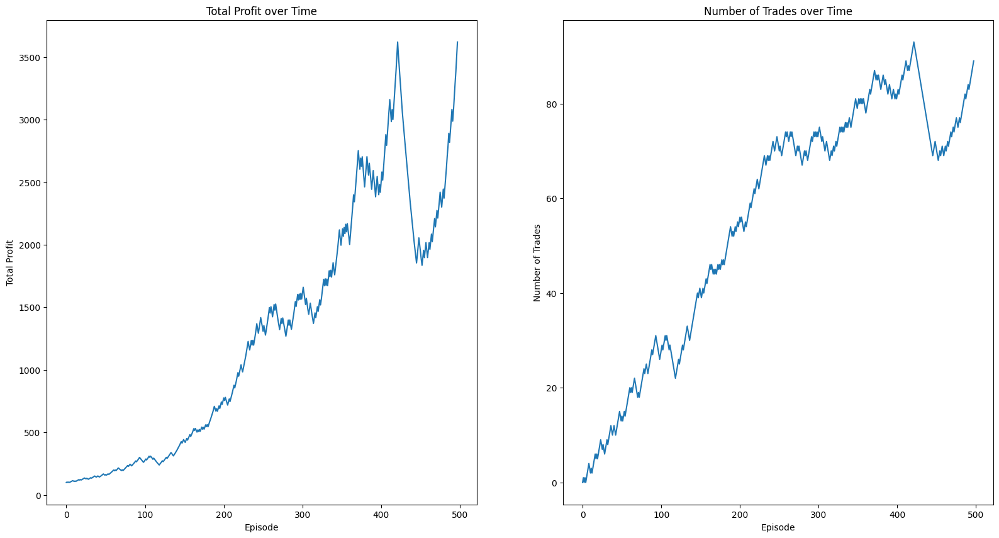

Simulation Results # None
Account Balance -  3621.2063646505594
Trades -  498
Wins -  293
Lossess -  204
Winarte -  58.835341365461844


In [11]:
train_steps = closest_power_of_2(len(train_df))
test_steps = closest_power_of_2(len(test_df))

env = TradingEnvironment(train_df,)  # Your custom environment
model = PPO('MlpPolicy', env, verbose=1, learning_rate=0.0003, n_steps=train_steps, n_epochs=100, gamma=0.95)
model.learn(total_timesteps=train_steps)

# Evaluate the model on the test environment
test_env = TradingEnvironment(test_df)
total_rewards = simulate_trading(model, test_env, num_steps=test_steps)  # Your custom simulation function
test_model_winrate = (total_rewards.getTotalWins() / total_rewards.total_trades) * 100

In [106]:
model.save("models\\reinforcement_learning_all_data")

### Second Model Trained and Results

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
2023-10-11 09:00:00
100
2023-10-11 09:05:00
101
2023-10-11 09:10:00
102
2023-10-11 09:15:00
103
2023-10-11 09:20:00
104
Trade Fee is: 1.8048021180030105
Entering a Long Trade at -  27113.05
2023-10-11 09:25:00
105
2023-10-11 09:30:00
106
2023-10-11 09:35:00
107
Trade Fee is: 1.8048021180030105
Trade Type:  Long  resulted in:  2.195197881997088  Making the account balance:  102.19519788199709
Long Trade Closed
2023-10-11 09:40:00
108
2023-10-11 09:45:00
109
2023-10-11 09:50:00
110
2023-10-11 09:55:00
111
2023-10-11 10:00:00
112
2023-10-11 10:05:00
113
2023-10-11 10:10:00
114
2023-10-11 10:15:00
115
2023-10-11 10:20:00
116
2023-10-11 10:25:00
117
2023-10-11 10:30:00
118
2023-10-11 10:35:00
119
Trade Fee is: 1.6332869227964306
Entering a Long Trade at -  27242.1
2023-10-11 10:40:00
120
2023-10-11 10:45:00
121
2023-10-11 10:50:00
122
2023-10-11 10:55:00
123
2023-10-11 11:00:00
124
2023-10-11 11:05

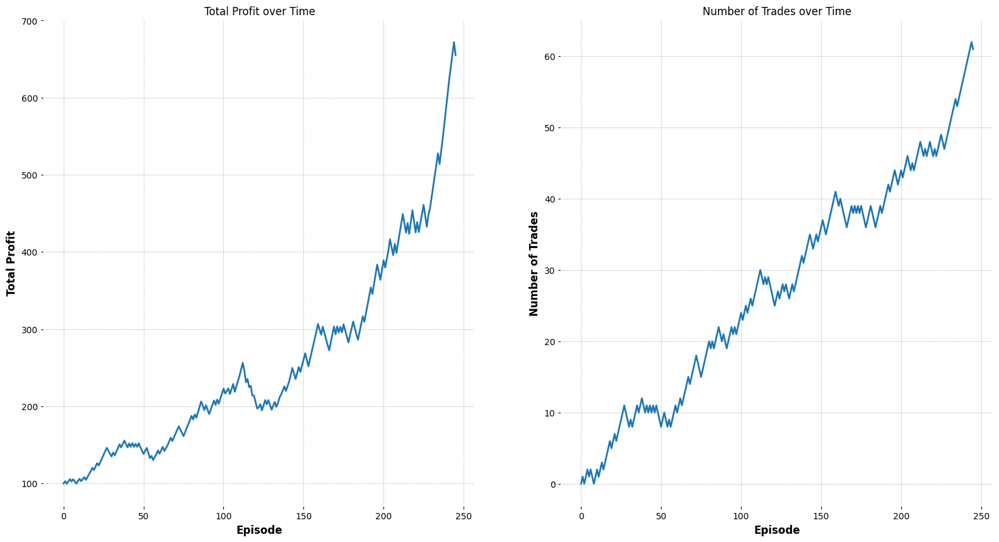

Simulation Results # None
Account Balance -  655.179894565489
Trades -  245
Wins -  153
Lossess -  92
Winarte -  62.44897959183674


In [37]:
train_steps = closest_power_of_2(len(train_df))
test_steps = closest_power_of_2(len(test_df))

env = TradingEnvironment(train_df,)  # Your custom environment
model = PPO('MlpPolicy', env, verbose=1, learning_rate=0.0003, n_steps=train_steps, n_epochs=100, gamma=0.95)
model.learn(total_timesteps=train_steps)

# Evaluate the model on the test environment
test_env = TradingEnvironment(test_df)
total_rewards = simulate_trading(model, test_env, num_steps=test_steps)  # Your custom simulation function
test_model_winrate = (total_rewards.getTotalWins() / total_rewards.total_trades) * 100

## Grid Search

In [ ]:
import itertools
import numpy as np

train_steps = closest_power_of_2(len(train_df_test))
test_steps = closest_power_of_2(len(test_df_test))

# Define your hyperparameters
learning_rates = [0.0001, 0.0003]
discount_factors = [0.99, 0.95]
entropy_coefficients = [0.01, 0.1, 0.5]
num_layers = [2, 3]
num_units = [64, 128]
clip_ranges = [0.1, 0.2]
# (0.0001, 0.95, 0.5, 2, 64, 0.2)
# Create a grid of all possible hyperparameter combinations
parameter_grid = list(itertools.product(learning_rates, discount_factors, entropy_coefficients,
                                         num_layers, num_units,
                                         clip_ranges,
                                         ))
# Placeholder for tracking results
results = []

for params in parameter_grid:
    lr, gamma, ent_coef, n_layers, n_units, clip_range = params
    # Set up your environment and model with the current set of hyperparameters
    print("Starting a new params")
    env = TradingEnvironment(train_df)  # Your custom environment
    model = PPO('MlpPolicy', env, verbose=1, learning_rate=lr, n_steps=train_steps,gamma=gamma,
                ent_coef=ent_coef, policy_kwargs={'net_arch': [dict(pi=[n_units]*n_layers, vf=[n_units]*n_layers)]},
                clip_range=clip_range)

    # Train the model
    model.learn(total_timesteps=train_steps)

    # Evaluate the model on the test environment
    test_env = TradingEnvironment(test_df)
    total_rewards = simulate_trading(model, test_env, num_steps=test_steps)  # Your custom simulation function
    test_model_winrate = (total_rewards.getTotalWins() / total_rewards.total_trades) * 100
    # Record the results
    results.append((params, test_model_winrate, test_env.entry_price))

print(results)

# Analyze the results to find the best parameter set
best_params = max(results, key=lambda x: x[1])
print("Best Parameters:", best_params[0])
print("Best Score:", best_params[1])


In [135]:
model.save("models\\reinforcement_learning")

## Loading and Testing Model

In [10]:
model = PPO.load("models\\reinforcement_learning_all_data.zip")

In [1]:
file_path = '..\\Data\\df_most_recent.csv'
recent_df = pd.read_csv(file_path)
# df = df.drop(df.columns[0], axis=1)
print(recent_df.head(5))

NameError: name 'pd' is not defined

In [72]:
split = int(0.9 * len(recent_df))

# Training data
df = recent_df[:split]
df_new_data = recent_df[split:]
df_new_data.reset_index(drop=True, inplace=True)


In [75]:
while len(df_new_data) > 0:
    current_data = df_new_data.iloc[0]
    # df_new_data = df_new_data.iloc[1:]
    df = pd.concat([df, current_data.to_frame().T], ignore_index=True)
    live_env = TradingEnvironment(df)           
    state = live_env.reset()
    action, _states = model.predict(state)
    new_state, reward, done, info = live_env.step(action)
    if done:
        live_env.reset()



0
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
2
2024-04-01 15:30:00
2
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
2
2024-04-01 15:30:00
2
2024-04-01 15:30:00
2
2024-04-01 15:30:00
2
2024-04-01 15:30:00
1
2024-04-01 15:30:00
0
2024-04-01 15:30:00
2
2024-04-01 15:30:00
0
2024-04-01 15:30:00
0
2024-04-01 15:30:00
2
2024-04-01 15:30:00
0
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
0
2024-04-01 15:30:00
2
2024-04-01 15:30:00
1
2024-04-01 15:30:00
1
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
1
2024-04-01 15:30:00
2
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
2
2024-04-01 15:30:00
0
2024-04-01 15:30:00
2
2024-04-01 15:30:00
1
2024-04-01 15:30:00
0
2024-04-01 15:30:00
2
2024-04-01 15:30:00
0
2024-04-01 15:30:00
0
2024-04-01 15:30:00
0
2024-04-01 15:30:00
0
2024-04-01 15:30:00
1
2024-04-01 15:30:00
2
2024-04-

KeyboardInterrupt: 